In [4]:
# Imports

# PyTorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
import torchvision.transforms as tr

# Models
from src.modelling.unet import Unet
from src.modelling.siamunet_conc import SiamUnet_conc
from src.modelling.siamunet_diff import SiamUnet_diff
from src.modelling.fresunet import FresUNet

# Other
import os
import numpy as np
import random
from skimage import io
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm as tqdm
from pandas import read_csv
from math import floor, ceil, sqrt, exp
from IPython import display
import time
from itertools import chain
import time
import warnings
from pprint import pprint
from pathlib import Path
import logging
from skimage.util import view_as_blocks
import pandas as pd 


print('IMPORTS OK')


IMPORTS OK


In [5]:
logging.basicConfig()
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)


In [6]:
from src.config import *
from src.io.utils_io import load_maxar_items, load_rs_path_toy, load_roi_town,make_path, check_dir,save_pickle, load_pickle
from src.utils import create_bbox, get_maxar_items_on_roi

In [7]:
data_labels_path = check_dir(processed_dir_path, "dataset", "png", "data_labelled")

In [8]:
def reshape_for_torch(I):
    """Transpose image for PyTorch coordinates."""
#     out = np.swapaxes(I,1,2)
#     out = np.swapaxes(out,0,1)
#     out = out[np.newaxis,:]
    out = I.transpose((2, 0, 1))
    return torch.from_numpy(out)

In [9]:
np.random.seed(1)
load_pickle(make_path("dataset_labelled.pkl", data_labels_path)).sample(3)

,annotation_id,labels_path,img_id,after_path,before_path,urban_area_path
3,4,NaN,7c3769e3-97a7-493e-9689-17207e6b9129,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...
16,17,NaN,b70b24f3-d7e8-4674-b4d6-a14409743e40,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...
6,7,/home/rustt/Documents/Projects/building_damage...,09c5a1c8-2e13-478a-bb1f-4af9277a0e8c,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...,/home/rustt/Documents/Projects/building_damage...


In [34]:
train = load_pickle(make_path("dataset_labelled_train.pkl", data_labels_path)).sample(3)

In [35]:
train.shape

(3, 5)

In [10]:
class ChangeDetectionDataset(Dataset):
    """Change Detection dataset class, used for both training and test data."""

    def __init__(self, 
                 path, 
                 train = True, 
                 patch_side = 96, 
                 stride = None, 
                 use_all_bands = False, 
                 transform=None,
                 size_test=0.2,
                 seed=12):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        
        # basics
        self.transform = transform
        self.path = path
        self.patch_side = patch_side
        self.stride = stride if stride is not None else 1
        
        fname = 'train' if train else 'test'
        #print(path + fname)
        self.meta_ds = load_pickle(make_path(f"dataset_labelled_{fname}.pkl", path))
        self.names = list(self.meta_ds.img_id)
        self.n_imgs = self.meta_ds.shape[0]
        
        # load images
        self.imgs_1 = {}
        self.imgs_2 = {}
        self.change_maps = {}
        self.n_patches_per_image = {}
        self.n_patches = 0
        self.patch_coords = []
        self.weights = []
        
        # init above dictionnaries
        self.create_patches()

    def create_patches(self):
        n_pix = 0
        true_pix = 0
        
        for im_name, b_path, a_path, cm_path in tqdm(self.meta_ds[["img_id","before_path", "after_path", "labels_path"]].values):
            # load and store each image
            I1 = io.imread(b_path)
            I2 = io.imread(a_path)
            cm = io.imread(cm_path)
            
            im_name = Path(b_path).stem


            s = cm.shape
            n_pix += np.prod(s)
            true_pix += cm.sum()
            
            # calculate the number of patches
            s = I1.shape
            # tensor : (c, h, w) = now it's np array
            n1 = ceil((s[0] - self.patch_side + 1) / self.stride)
            n2 = ceil((s[1] - self.patch_side + 1) / self.stride)
            n_patches_i = n1 * n2
            self.n_patches_per_image[im_name] = n_patches_i
            self.n_patches += n_patches_i
            
            # generate path coordinates
            for i in range(n1):
                for j in range(n2):
                    # coordinates in (x1, x2, y1, y2)
                    current_patch_coords = (im_name, 
                                    [self.stride*i, self.stride*i + self.patch_side, self.stride*j, self.stride*j + self.patch_side],
                                    [self.stride*(i + 1), self.stride*(j + 1)])
                    self.patch_coords.append(current_patch_coords)
        del I1
        del I2
        del cm                    
        self.weights = [ FP_MODIFIER * 2 * true_pix / n_pix, 2 * (n_pix - true_pix) / n_pix]

        
    
    def get_img(self, im_name):
            b_path, a_path, cm_path = self.meta_ds.loc[self.meta_ds.img_id == im_name, ["before_path", "after_path", "labels_path"]].values.squeeze()
            I1 = io.imread(b_path)
            I2 = io.imread(a_path)
            cm = (io.imread(cm_path) > 0)*1.
            return I1, I2, cm

    def _get_img(self, im_name):
        
        return self.imgs_1[im_name], self.imgs_2[im_name], self.change_maps[im_name]

    def __len__(self):
        return self.n_patches

    def __getitem__(self, idx):
        current_patch_coords = self.patch_coords[idx]
        im_name = current_patch_coords[0]
        limits = current_patch_coords[1]
        centre = current_patch_coords[2]

        I1, I2, cm = self.get_img(im_name)
        
        I1 = I1[limits[0]:limits[1], limits[2]:limits[3], :]
        I2 = I2[limits[0]:limits[1], limits[2]:limits[3], :]
        
        label = cm[limits[0]:limits[1], limits[2]:limits[3]]
        
        
        if self.transform:
            if isinstance(self.transform, A.Compose):
                transformed = train_transform(image=I1,
                        image1=I2,
                        mask=label,
                        )
                sample = {
                    "I1":reshape_for_torch(transformed["image"]),
                    "I2":reshape_for_torch(transformed["image1"]),
                    "label":torch.from_numpy((transformed["mask"] > 0) * 1.).float()
                }
                    
            else: # default transform
                I1, I2, label = reshape_for_torch(I1), reshape_for_torch(I2), torch.from_numpy(label).float()
                sample = {'I1': I1, 'I2': I2, 'label': label}
                sample = self.transform(sample)
        else: # no transform, i.e test set
            I1, I2, label = reshape_for_torch(I1), reshape_for_torch(I2), torch.from_numpy(label).float()
            sample = {'I1': I1, 'I2': I2, 'label': label}

        return sample

In [11]:
class RandomFlip(object):
    """Flip randomly the images in a sample."""

#     def __init__(self):
#         return

    def __call__(self, sample):
        I1, I2, label = sample['I1'], sample['I2'], sample['label']
        
        if random.random() > 0.5:
            I1 =  I1.numpy()[:,:,::-1].copy()
            I1 = torch.from_numpy(I1)
            I2 =  I2.numpy()[:,:,::-1].copy()
            I2 = torch.from_numpy(I2)
            label =  label.numpy()[:,::-1].copy()
            label = torch.from_numpy(label)

        return {'I1': I1, 'I2': I2, 'label': label}



class RandomRot(object):
    """Rotate randomly the images in a sample."""

#     def __init__(self):
#         return

    def __call__(self, sample):
        I1, I2, label = sample['I1'], sample['I2'], sample['label']
        
        n = random.randint(0, 3)
        if n:
            I1 =  sample['I1'].numpy()
            I1 = np.rot90(I1, n, axes=(1, 2)).copy()
            I1 = torch.from_numpy(I1)
            I2 =  sample['I2'].numpy()
            I2 = np.rot90(I2, n, axes=(1, 2)).copy()
            I2 = torch.from_numpy(I2)
            label =  sample['label'].numpy()
            label = np.rot90(label, n, axes=(0, 1)).copy()
            label = torch.from_numpy(label)

        return {'I1': I1, 'I2': I2, 'label': label}

In [12]:
import albumentations as A
import cv2

train_transform = A.Compose([
    A.Superpixels(p_replace=0.1, n_segments=30,),
    A.Sharpen(p=0.5),
    A.GaussianBlur(blur_limit=(3, 3), p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.3),
    A.RandomBrightnessContrast(p=0.2),
], additional_targets={
                "image1": "image",
                "mask": "mask",
                    }
)

In [206]:
sample_test = train_dataset[999]

In [207]:
img_1 = sample_test["I1"]
img_2 = sample_test["I2"]
mask = sample_test["label"]

In [209]:
img_1 = img_1.detach().numpy().transpose(1, 2, 0)
img_2 = img_2.detach().numpy().transpose(1, 2, 0)
mask = mask.detach().numpy()

AttributeError: 'numpy.ndarray' object has no attribute 'detach'

In [210]:
transformed = train_transform(image=img_1,
                        image1=img_2,
                        mask=mask,
                        )

In [211]:
isinstance(train_transform, A.Compose)

True

In [212]:
img_1_trans = transformed["image"]
img_2_trans = transformed["image1"]
mask_trans = transformed["image1"]

In [215]:
path = train_dataset.patch_coords[999]

In [216]:
path

('8e7cdfe0-8423-49a9-88d0-643584beb4ea', [423, 519, 893, 989], [470, 940])

In [217]:
I1, I2, cm = train_dataset.get_img("8e7cdfe0-8423-49a9-88d0-643584beb4ea")

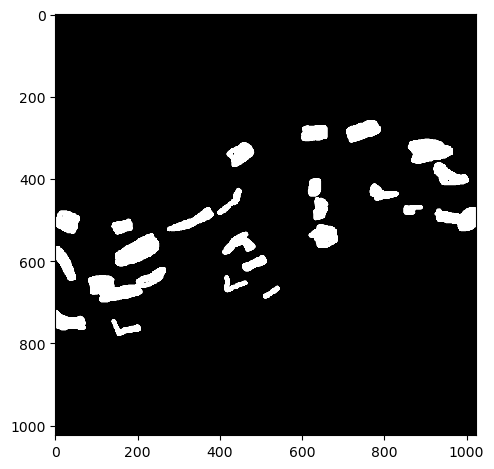

In [220]:
io.imshow(cm)

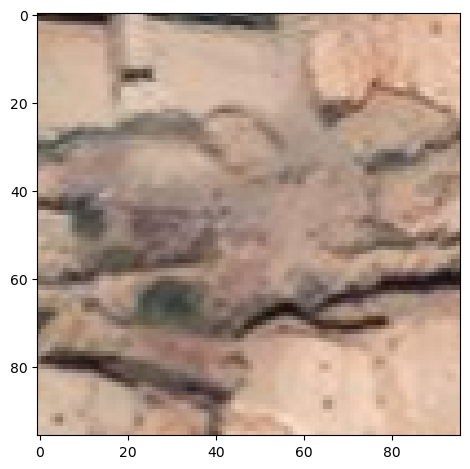

In [213]:
io.imshow(img_1_trans)

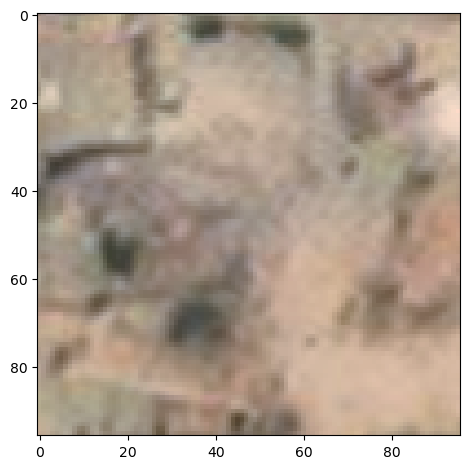

In [219]:
io.imshow(img_2_trans)

/home/rustt/miniforge3/envs/damage_detection/lib/python3.10/site-packages/skimage/io/_plugins/matplotlib_plugin.py:149: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


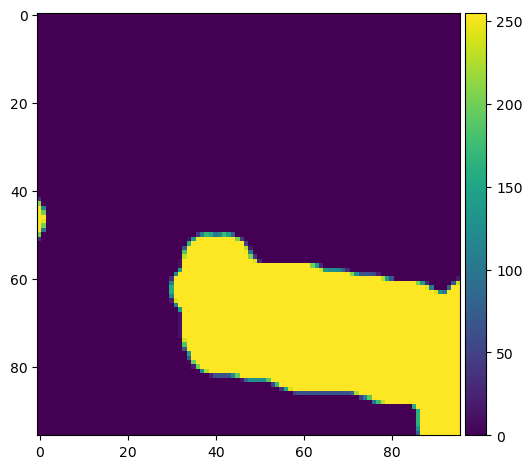

In [214]:
io.imshow(mask)

In [13]:
SEED = 12
DROP_NAN = True
SIZE_TEST = 0.3

In [50]:
np.random.seed(SEED)
ds = load_pickle(make_path("dataset_labelled.pkl", data_labels_path))
if DROP_NAN: 
    ds = ds.dropna()
n_sample = int(len(ds)*SIZE_TEST)
ds_test = ds.sample(n_sample)
ds_train = ds[~ds.index.isin(ds_test.index)]

save_pickle(ds_train, make_path("dataset_labelled_train.pkl", processed_dir_path, "dataset", "png", "data_labelled"))
save_pickle(ds_test, make_path("dataset_labelled_test.pkl", processed_dir_path, "dataset", "png", "data_labelled"))

In [51]:
ds.before_path.values[:3]

array(['/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/before/3d2355ab-f7b9-4e01-8cb0-0926b0158fd6.png',
       '/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/before/06c5f930-99be-4350-92ac-83ec3f5fc66d.png',
       '/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/before/8e7cdfe0-8423-49a9-88d0-643584beb4ea.png'],
      dtype=object)

In [234]:
d_res["label"].flatten().unique()

tensor([0., 1.])

In [ ]:
io.imshow(d_res["I2"])

In [ ]:
io.imshow(d_res["I1"])

io.imshow(d_res["label"])

In [199]:
dict_model_id = {
    1:{"name":"Unet", "model":Unet, "input":(2*3, 2)},
    2:{"name":"FC-Siam-conc","model":SiamUnet_conc,  "input":(3, 2)},
    3:{"name":"FC-Siam-diff", "model":SiamUnet_diff,  "input":(3, 2)},
    4:{"name":"FresUNet","model":FresUNet,  "input":(2*3, 2)}
}

In [19]:
from torchinfo import summary

In [20]:
summary(model)

NameError: name 'model' is not defined

In [59]:
arr = np.random.rand(10, 2)
tens = torch.from_numpy(arr).float()

torch.argmax(tens, 1)

tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 1])

In [60]:
tens

tensor([[0.1527, 0.3024],
        [0.0620, 0.4599],
        [0.8353, 0.9270],
        [0.7270, 0.7685],
        [0.2692, 0.6440],
        [0.0934, 0.0797],
        [0.5896, 0.3433],
        [0.9889, 0.6265],
        [0.6818, 0.5523],
        [0.2689, 0.3733]])

In [14]:
def seed_torch(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # torch.cuda.manual_seed_all(seed) # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=777)

In [15]:
def train_one_epoch(train_loader):

    running_loss = 0
    #model.train(True)

    for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)): 
        # convert to float/long ?
        pre_img, post_img = batch["I1"].float().to(device), batch["I2"].float().to(device)  
        label = batch["label"].long().to(device)
        
        output = model(pre_img, post_img)
        # _, output = torch.max(output, dim=1)
        loss = criterion(output, label)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        running_loss += loss.item()
        #bar.set_postfix(ordered_dict={"train_loss":loss.item()})

    scheduler.step()
    avg_loss = running_loss / (i + 1)

    return running_loss


def validate_epoch(valid_loader): 
    model.eval()
    running_loss = 0

    with torch.no_grad():
        for i, batch in tqdm(enumerate(valid_loader), total=len(valid_loader)):
            pre_img, post_img = batch["I1"].float().to(device), batch["I2"].float().to(device)  
            label = batch["label"].long().to(device)
            output = model(pre_img, post_img)

            loss = criterion(output, label)
            running_loss += loss.item()
    
    avg_loss = running_loss / (i + 1)
        
    return avg_loss


In [ ]:
tra

## Run training

In [25]:
# Global Variables' Definitions

FP_MODIFIER = 1 # Tuning parameter, use 1 if unsure

BATCH_SIZE = 32
PATCH_SIDE = 96
NORMALISE_IMGS = True
TRAIN_STRIDE = int(PATCH_SIDE/2) - 1
#TYPE = 0 # 0-RGB | 1-RGBIr | 2-All bands s.t. resulution <= 20m | 3-All bands


print('DEFINITIONS OK')

# custom, default or None
DATA_AUG = "default"


if DATA_AUG == "default":
    data_transform = tr.Compose([RandomFlip(), RandomRot()])
elif DATA_AUG == "custom":
    data_transform = train_transform
else:
    data_transform = None

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"DEVICE : {device}")

    
train_dataset = ChangeDetectionDataset(data_labels_path, 
                                       train = True,
                                       patch_side=PATCH_SIDE,
                                       stride = TRAIN_STRIDE, 
                                       transform=data_transform)

test_dataset = ChangeDetectionDataset(data_labels_path, 
                                      train = False, 
                                      patch_side=PATCH_SIDE,
                                      stride = TRAIN_STRIDE)


train_loader = DataLoader(train_dataset, 
                          batch_size = BATCH_SIZE,
                          shuffle = True, 
                          num_workers = 4)

test_loader = DataLoader(test_dataset, 
                         batch_size = BATCH_SIZE, 
                         shuffle = True, 
                         num_workers = 4)

print('DATASETS OK')

DEFINITIONS OK
DEVICE : cpu


100%|█████████████████████████████████████████████████████| 3/3 [00:00<00:00, 27.44it/s]

DATASETS OK


In [26]:
len(train_loader)

88

In [19]:
dict_model_id = {
    1:{"name":"Unet", "model":Unet, "input":(2*3, 2)},
    2:{"name":"FC-Siam-conc","model":SiamUnet_conc,  "input":(3, 2)},
    3:{"name":"FC-Siam-diff", "model":SiamUnet_diff,  "input":(3, 2)},
    4:{"name":"FresUNet","model":FresUNet,  "input":(2*3, 2)}
}

In [28]:
save = True
N_EPOCHS = 20
best_loss = 1000
valid_loss = []
train_loss = []


CHOSEN_MODEL=4

_model = dict_model_id[CHOSEN_MODEL]["model"]
_name = dict_model_id[CHOSEN_MODEL]["name"]
_input = dict_model_id[CHOSEN_MODEL]["input"]
model, model_name = _model(*_input), _name


SAVE_NAME = f"model_{model_name}_augm_{DATA_AUG}_sb{BATCH_SIZE}_sp{PATCH_SIDE}"


optimizer = torch.optim.Adam(model.parameters(), weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.95)
model.to(device)
weights = torch.FloatTensor(train_dataset.weights).to(device)

#criterion = nn.NLLLoss(weight=weights) # to be used with logsoftmax output
#criterion = nn.BCELoss(weight=weights)
criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss(weight=weights)


for epoch_index in range(N_EPOCHS):
    logger.info(f'=== EPOCH {epoch_index+1}/{N_EPOCHS} === ')
    
    tloss =  train_one_epoch(train_loader)
    vloss =  validate_epoch(test_loader)
    logger.info(f'LOSS ::: train {tloss:.4f} -- valid {vloss:.4f}')


    train_loss.append(tloss)
    valid_loss.append(vloss)

    if tloss < best_loss:
        best_loss = tloss
        if save:
            model_path_ep = os.path.join(models_dir_path, f'{SAVE_NAME}_best_loss')
            torch.save(model.state_dict(), model_path_ep)
    
if save:
    model_path = os.path.join(models_dir_path, f'{SAVE_NAME}_ep{epoch_index+1}')
    torch.save(model.state_dict(), model_path)
    res_loss = dict(train_loss=train_loss, valid_loss=valid_loss)
    save_pickle(res_loss, make_path(f'{SAVE_NAME}.pkl', models_dir_path))

logger.info(f"Model saved : \n full : {model_path} \n best ep : {model_path_ep}")
logger.info("#### Training Done ####")


INFO:__main__:=== EPOCH 1/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:19<00:00,  1.98it/s]
INFO:__main__:LOSS ::: train 16.7682 -- valid 0.1279
INFO:__main__:=== EPOCH 2/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:18<00:00,  2.03it/s]
INFO:__main__:LOSS ::: train 9.6733 -- valid 0.1061
INFO:__main__:=== EPOCH 3/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:18<00:00,  2.04it/s]
INFO:__main__:LOSS ::: train 8.5189 -- valid 0.0897
INFO:__main__:=== EPOCH 4/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:19<00:00,  1.99it/s]
INFO:__main__:LOSS ::: train 8.3133 -- valid 0.0926
INFO:__main__:=== EPOCH 5/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:19<00:00,  1.94it/s]
INFO:__main__:LOSS ::: train 8.0761 -- valid 0.0906
INFO:__main__:=== EPOCH 6/20 === 
100%|███████████████████████████████████████████████████| 38/38 [00:20<00:00,  1.89it/s]
I

In [30]:
def load_model(model_id, path): 
    args = dict_model_id[model_id]["input"]
    model = dict_model_id[model_id]["model"](*args)
    model.load_state_dict(torch.load(path))
    model.eval()
    return model

In [31]:
model = load_model(3, model_path)

In [32]:
from torchinfo import summary

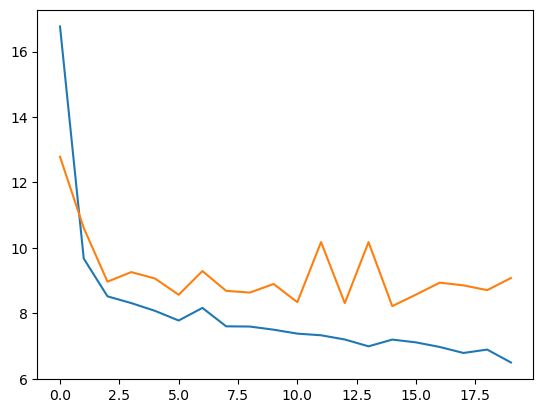

In [31]:
plt.plot(train_loss)
plt.plot([_*100 for _ in valid_loss])

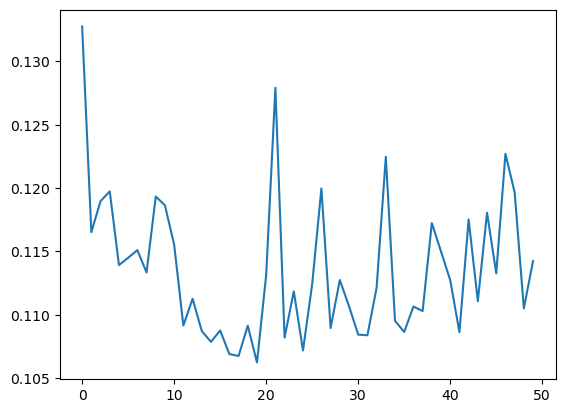

In [65]:
plt.plot(epoch_test_loss)

In [66]:
epoch_test_nochange_accuracy

array([ 99.99995065, 100.        , 100.        , 100.        ,
       100.        , 100.        , 100.        , 100.        ,
       100.        , 100.        , 100.        , 100.        ,
       100.        , 100.        , 100.        , 100.        ,
       100.        , 100.        , 100.        , 100.        ,
       100.        ,  99.99965457, 100.        ,  99.99990131,
        99.99995065,  99.99837154,  99.99215377,  99.99960522,
        99.98963706,  99.995312  ,  99.99032792,  99.98440624,
        99.86913081,  99.88378698,  99.8795431 ,  99.70317565,
        99.71210752,  99.65728261,  99.58340962,  99.58987412,
        99.73668251,  99.62333163,  99.18966706,  99.58291614,
        99.1991911 ,  99.31895713,  98.67724411,  98.98408597,
        99.55705813,  99.39584031])

In [67]:
epoch_test_change_accuracy

array([1.41440715e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.41440715e-03, 7.07203576e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.27296644e-02, 4.66754360e-02, 8.48644291e-03,
       1.07494943e-01, 1.06080536e-01, 8.06212076e-02, 1.47098344e-01,
       1.61949619e+00, 7.94896819e-01, 1.75952250e+00, 4.25029349e+00,
       3.64068401e+00, 4.26302315e+00, 4.15835702e+00, 3.99994342e+00,
       2.45258200e+00, 5.18097340e+00, 7.93340971e+00, 5.00134369e+00,
       7.56000622e+00, 7.82450036e+00, 1.32430942e+01, 9.13848460e+00,
       5.54447603e+00, 6.71984838e+00])

In [68]:
epoch_test_precision

array([0.5       , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       1.        , 0.41666667, 0.        , 0.        , 0.        ,
       0.21428571, 0.171875  , 0.42857143, 0.26573427, 0.44117647,
       0.22529644, 0.24761905, 0.30155386, 0.1926637 , 0.3375848 ,
       0.33314856, 0.30613701, 0.30264083, 0.25830258, 0.25388275,
       0.24526167, 0.32427408, 0.25460735, 0.29496163, 0.24776341,
       0.28614286, 0.25887525, 0.23887164, 0.30397022, 0.27956926])

In [70]:
epoch_test_recall

array([1.41440715e-05, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.41440715e-05, 7.07203576e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.27296644e-04, 4.66754360e-04, 8.48644291e-05,
       1.07494943e-03, 1.06080536e-03, 8.06212076e-04, 1.47098344e-03,
       1.61949619e-02, 7.94896819e-03, 1.75952250e-02, 4.25029349e-02,
       3.64068401e-02, 4.26302315e-02, 4.15835702e-02, 3.99994342e-02,
       2.45258200e-02, 5.18097340e-02, 7.93340971e-02, 5.00134369e-02,
       7.56000622e-02, 7.82450036e-02, 1.32430942e-01, 9.13848460e-02,
       5.54447603e-02, 6.71984838e-02])

In [71]:
epoch_test_Fmeasure

array([2.82873428e-05, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       2.82877429e-05, 1.41416713e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.54442136e-04, 9.30980492e-04, 1.69695256e-04,
       2.14123713e-03, 2.11652157e-03, 1.60667475e-03, 2.92459330e-03,
       3.07390802e-02, 1.52680051e-02, 3.34471540e-02, 7.53879154e-02,
       6.50747703e-02, 7.47334490e-02, 7.16348087e-02, 6.91104594e-02,
       4.45924573e-02, 8.93447321e-02, 1.20973569e-01, 8.55252815e-02,
       1.15850619e-01, 1.22886909e-01, 1.75223872e-01, 1.32195726e-01,
       9.37832697e-02, 1.08352814e-01])

In [75]:
len(train_loader)

100

Il y a t-il des dommage labellisé sur le jeu de test ?? OUI

In [2]:
test_set= load_pickle(make_path("dataset_labelled_test.pkl", processed_dir_path, "dataset", "png", "data_labelled"))

NameError: name 'load_pickle' is not defined

In [35]:
test_set.img_id.values

array(['49a91dea-ed40-4772-b6b9-f9683509b8ac',
       'd56aa5a0-6a45-44dd-a227-9a5eab169393',
       '465955c3-57fd-4b53-b347-1e9ea61d26d7'], dtype=object)

In [36]:
test_set.labels_path.values.tolist()

['/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/labels/task-9-annotation-9-by-1-tag-damage_building-0.png',
 '/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/labels/task-19-annotation-19-by-1-tag-damage_building-0.png',
 '/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/labels/task-16-annotation-16-by-1-tag-damage_building-0.png']

In [37]:
test_set.columns

Index(['annotation_id', 'labels_path', 'img_id', 'after_path', 'before_path'], dtype='object')

In [1]:
mask_batch = test_set["labels_path"].values
mask_batch = [io.imread(_) for _ in mask_batch]

batch = test_set[["before_path", "after_path"]].values

batch = [(io.imread(_[0]), io.imread(_[1])) for _ in batch]

output = []
for pre_img, post_img in batch:
    pre_img = torch.from_numpy(pre_img.transpose(2, 0, 1)).float().unsqueeze(0)
    post_img = torch.from_numpy(post_img.transpose(2, 0, 1)).float().unsqueeze(0)

    output.append(model(pre_img, post_img))

output = [_.detach().numpy() for _ in output]



NameError: name 'test_set' is not defined

In [ ]:
output = [np.max(_, axis=1) for _ in output]
output = [_.squeeze(0) for _ in output]

output[0].shape

def sig(x):
 return 1/(1 + np.exp(-x))

<Axes: >

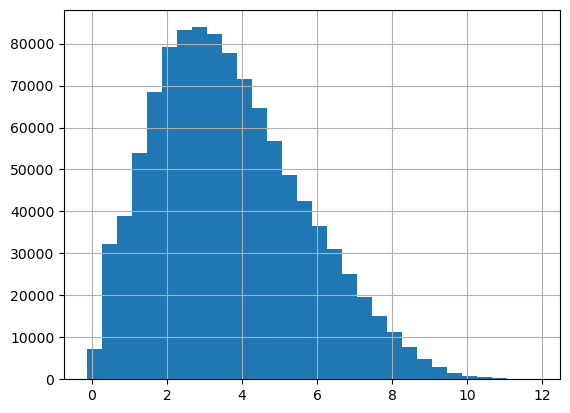

In [105]:
pd.Series(output[0].flatten()).hist(bins=30)

In [3]:
pd.Series(sig(output[0].flatten())).hist(bins=30)

NameError: name 'pd' is not defined

In [39]:
out_prob = sig(output[0])

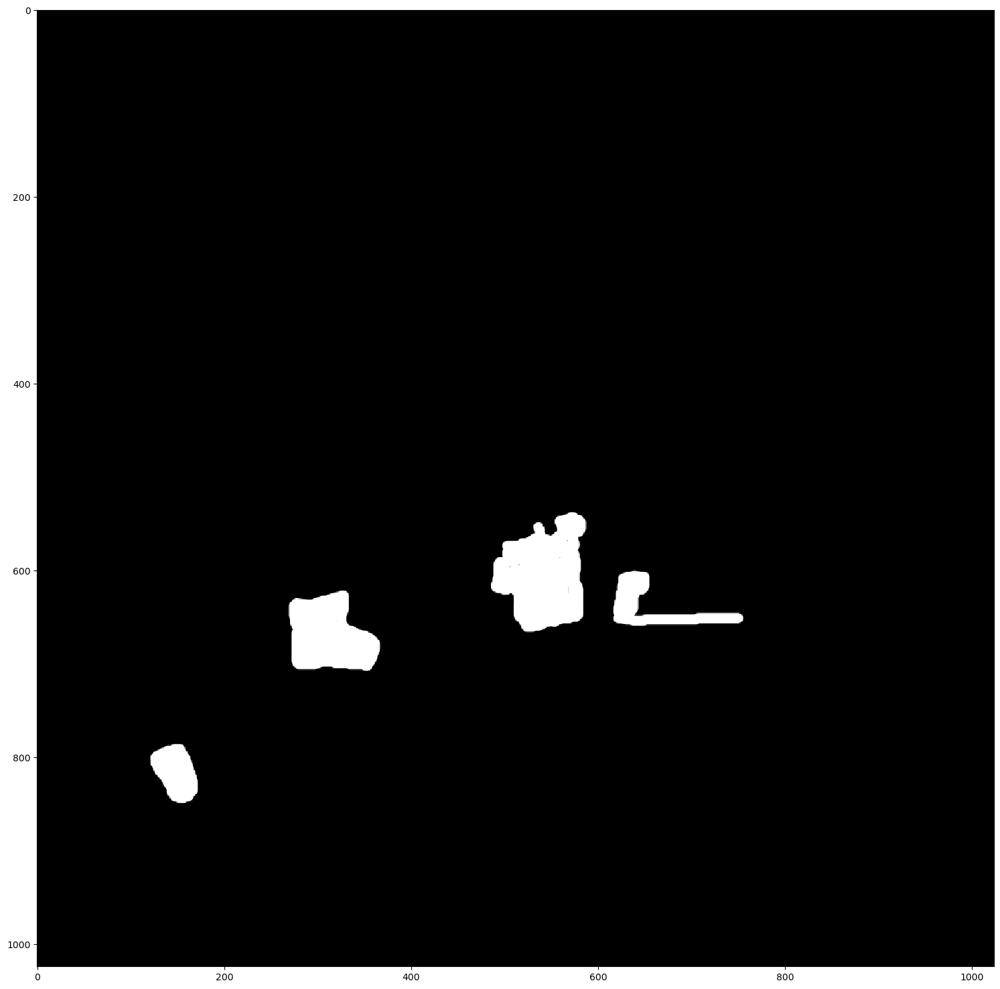

In [119]:
plt.figure(figsize=(15, 15))
io.imshow(mask_batch[0])

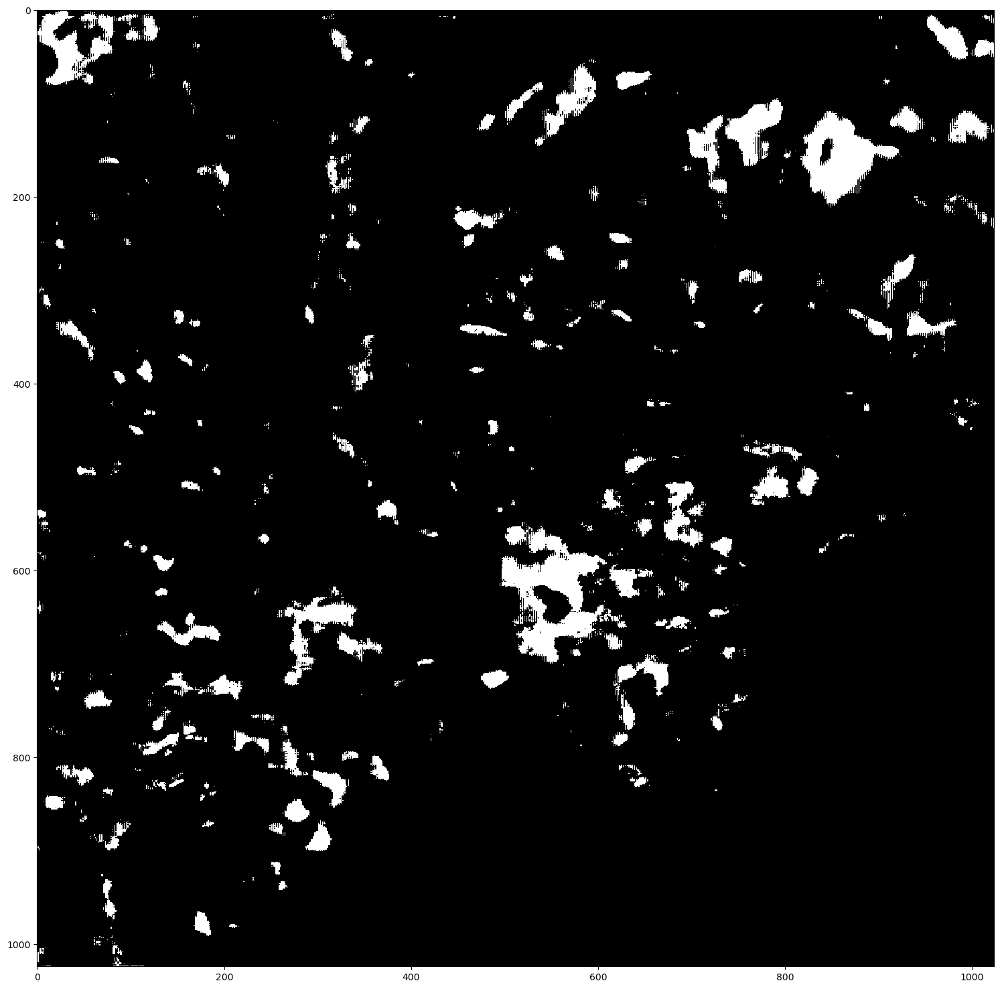

In [121]:
plt.figure(figsize=(15, 15))
io.imshow(out_prob < 0.7)

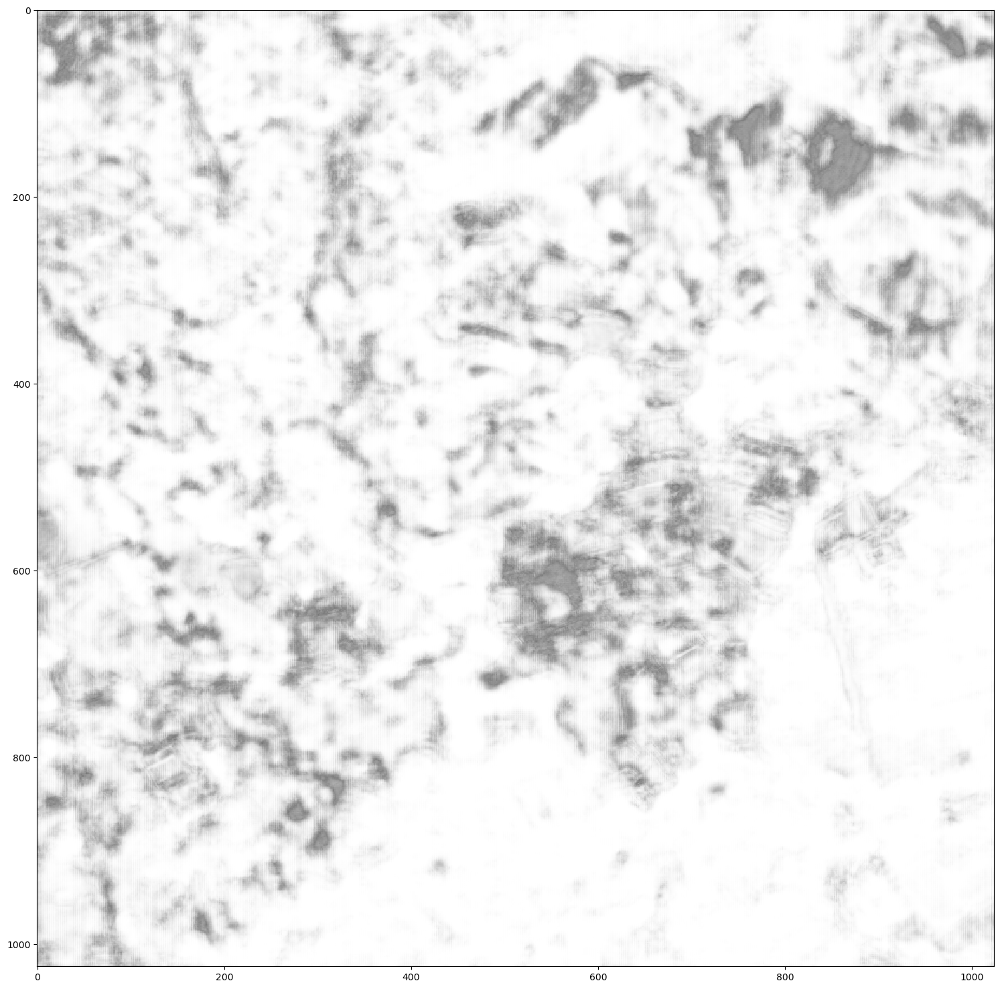

In [115]:
plt.figure(figsize=(15, 15))
io.imshow(out_prob)

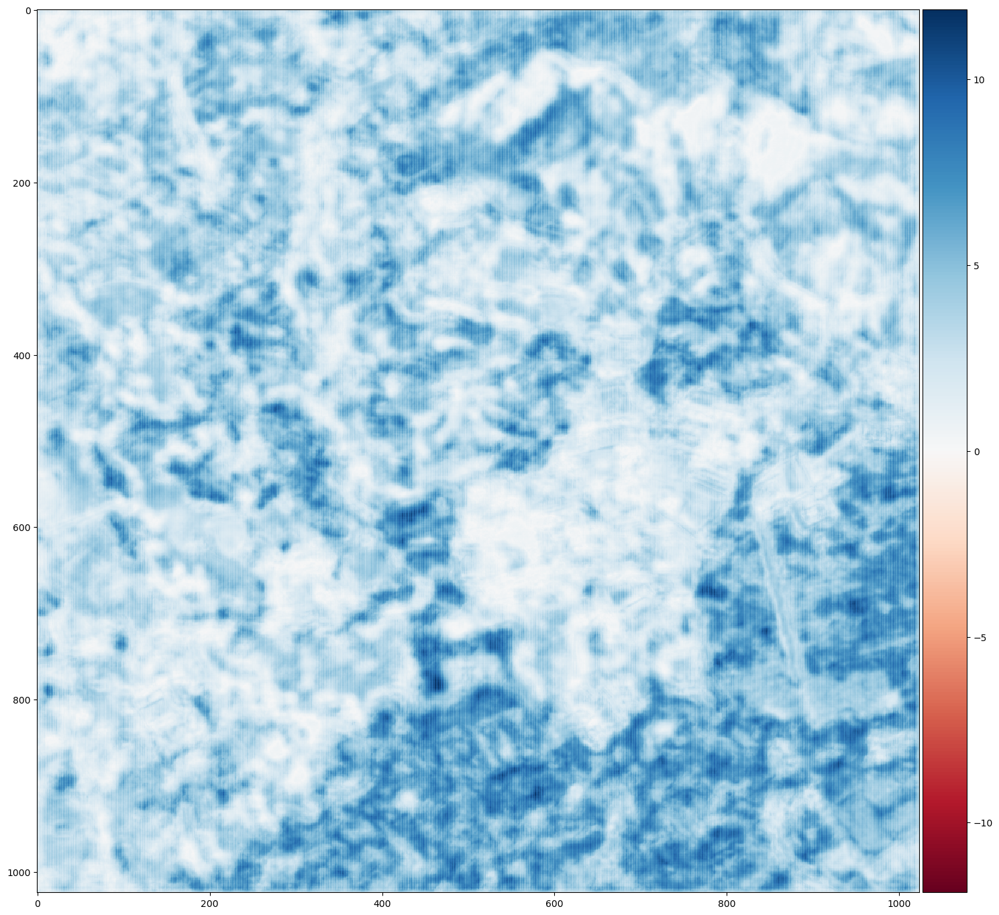

In [100]:
plt.figure(figsize=(15, 15))
io.imshow(output[0]<)

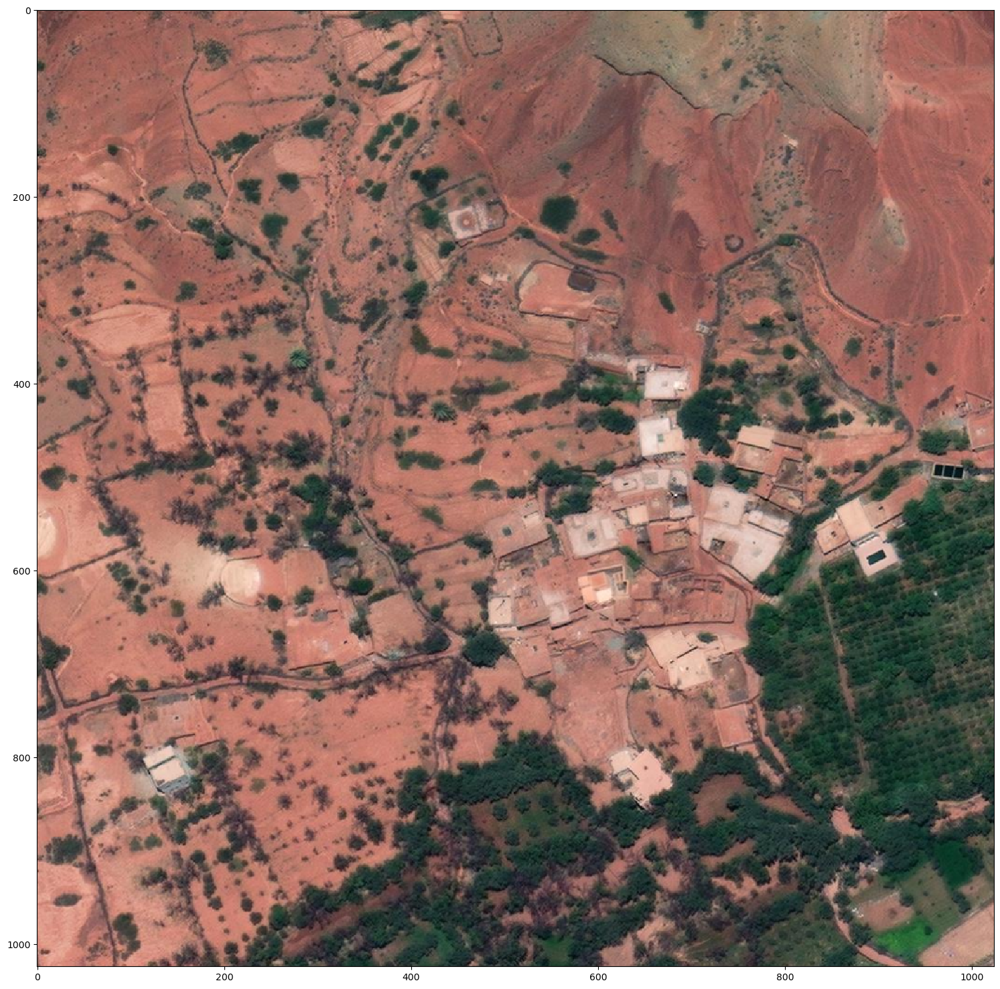

In [111]:
plt.figure(figsize=(15, 15))
io.imshow(batch[0][0])

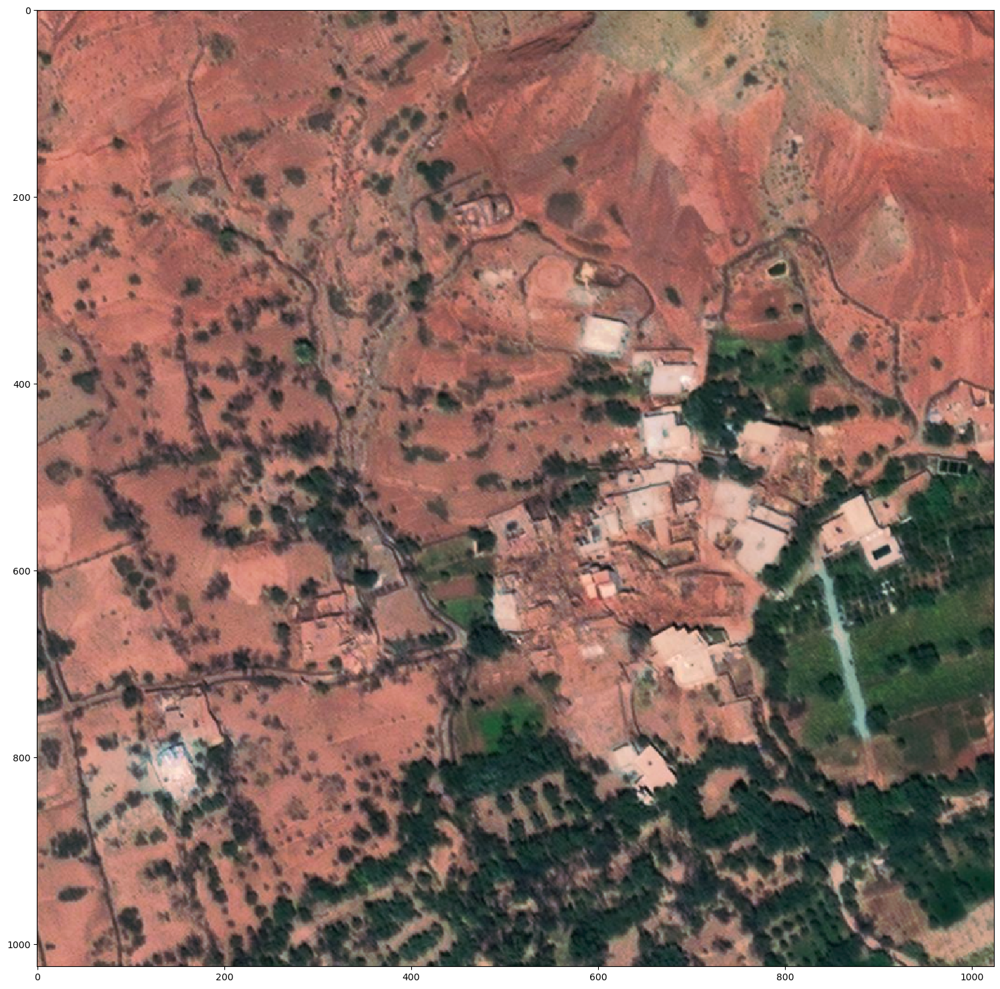

In [110]:
plt.figure(figsize=(15, 15))
io.imshow(batch[0][1])

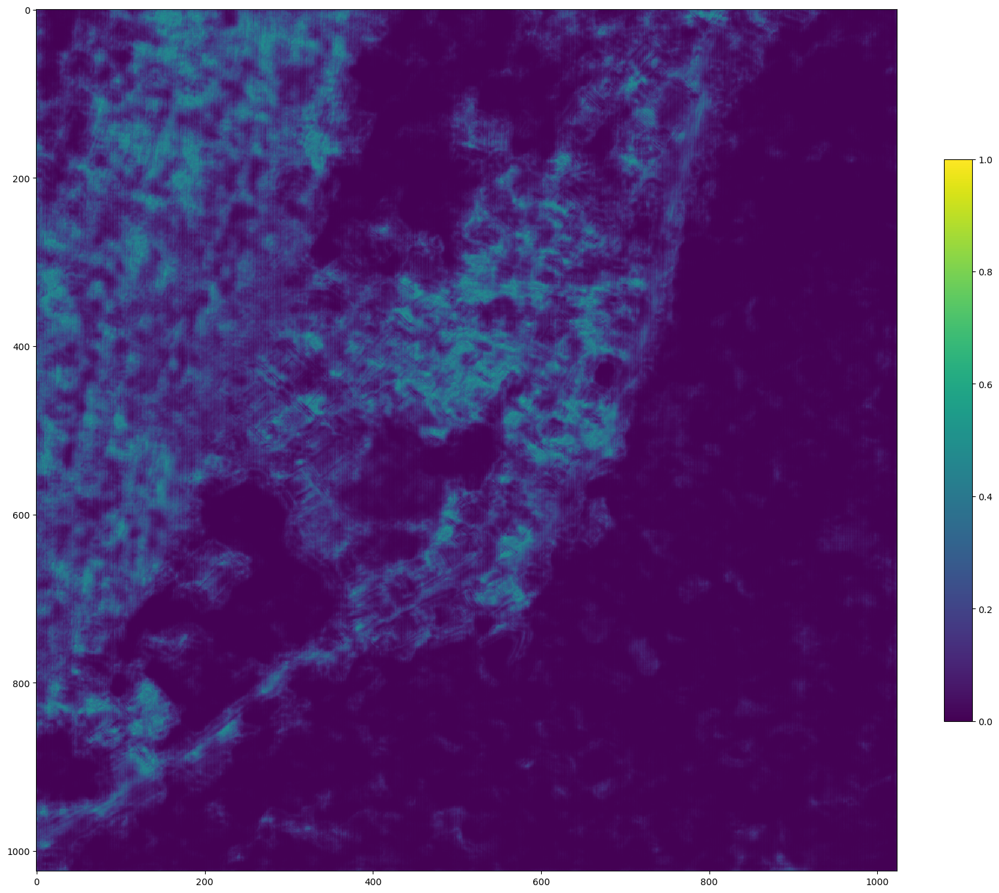

In [148]:
plt.figure(figsize=(15, 15))
lc = io.imshow((1-out_prob), cmap="viridis")
plt.colorbar(lc, fraction=0.03)

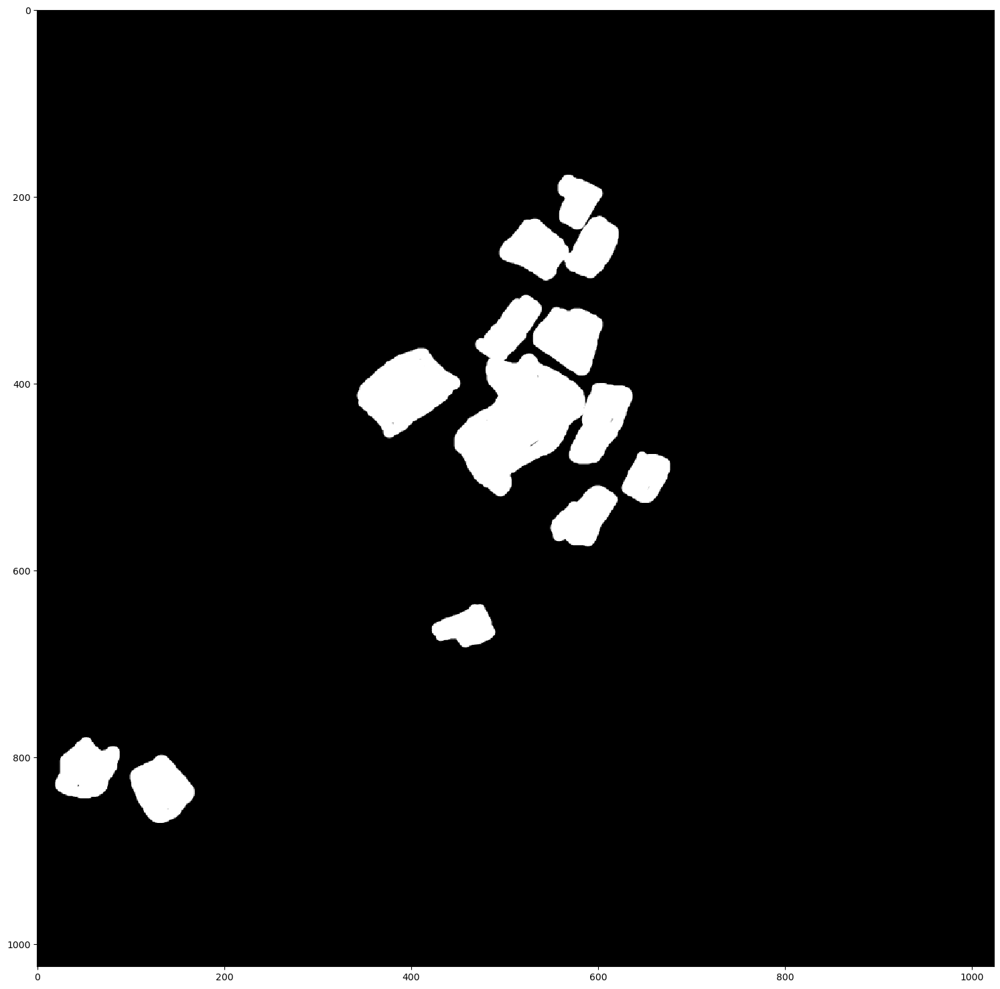

In [142]:
plt.figure(figsize=(15, 15))
io.imshow(mask_batch[1])

In [124]:
out_prob = sig(output[1])

##### RAG

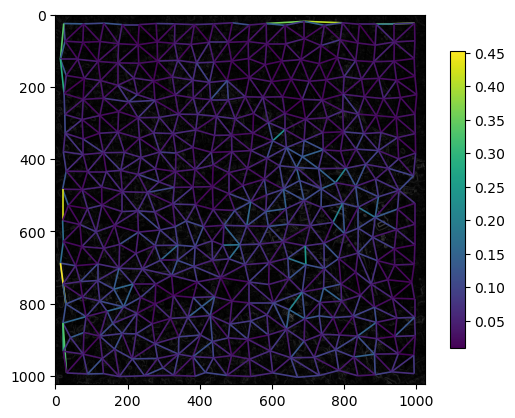

In [131]:
from skimage import graph
from skimage import data, segmentation, color, filters, io
from matplotlib import pyplot as plt


img = batch[0][1]
gimg = color.rgb2gray(img)

labels = segmentation.slic(img, compactness=30, n_segments=400, start_label=1)
edges = filters.sobel(gimg)
edges_rgb = color.gray2rgb(edges)

g = graph.rag_boundary(labels, edges)
lc = graph.show_rag(labels, g, edges_rgb, img_cmap=None, edge_cmap='viridis',
                    edge_width=1.2)

plt.colorbar(lc, fraction=0.03)

In [150]:
out_prob.shape

(1024, 1024)

##### Super pixels comparison

/tmp/ipykernel_169902/3929205114.py:44: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  contour.collections[0].set_label("Iteration 2")
/tmp/ipykernel_169902/3929205114.py:46: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  contour.collections[0].set_label("Iteration 7")
/tmp/ipykernel_169902/3929205114.py:48: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  contour.collections[0].set_label("Iteration 35")


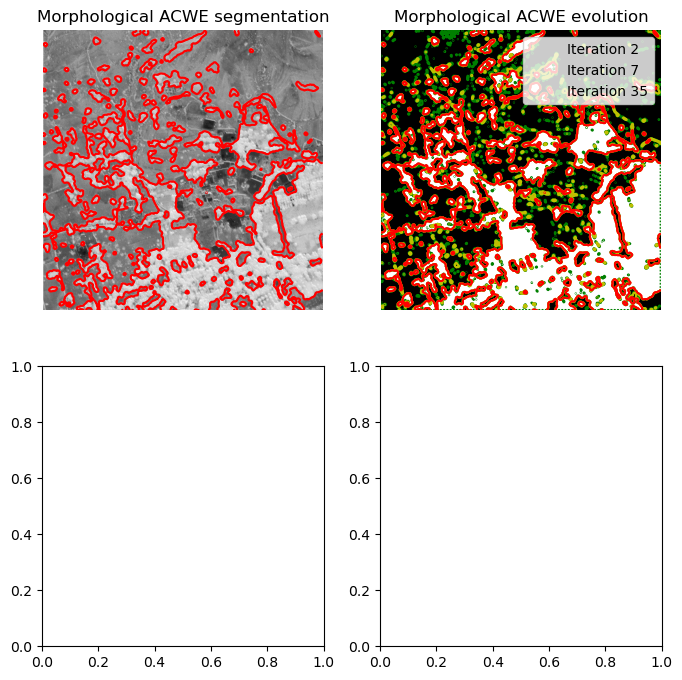

In [160]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.segmentation import (morphological_chan_vese,
                                  morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient,
                                  checkerboard_level_set)


def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))

    return _store


# Morphological ACWE
image = img_as_float(batch[0][1])
image = 1 - rgb2gray(image)

# Initial level set
init_ls = checkerboard_level_set(image.shape, 6)
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = morphological_chan_vese(image, num_iter=35, init_level_set=init_ls,
                             smoothing=3, iter_callback=callback)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.flatten()

ax[0].imshow(image, cmap="gray")
ax[0].set_axis_off()
ax[0].contour(ls, [0.5], colors='r')
ax[0].set_title("Morphological ACWE segmentation", fontsize=12)

ax[1].imshow(ls, cmap="gray")
ax[1].set_axis_off()
contour = ax[1].contour(evolution[2], [0.5], colors='g')
contour.collections[0].set_label("Iteration 2")
contour = ax[1].contour(evolution[7], [0.5], colors='y')
contour.collections[0].set_label("Iteration 7")
contour = ax[1].contour(evolution[-1], [0.5], colors='r')
contour.collections[0].set_label("Iteration 35")
ax[1].legend(loc="upper right")
title = "Morphological ACWE evolution"
ax[1].set_title(title, fontsize=12)


# Morphological GAC
image = img_as_float(data.coins())
gimage = inverse_gaussian_gradient(image)

# Initial level set
init_ls = np.zeros(image.shape, dtype=np.int8)
init_ls[10:-10, 10:-10] = 1
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = morphological_geodesic_active_contour(gimage, num_iter=230,
                                           init_level_set=init_ls,
                                           smoothing=1, balloon=-1,
                                           threshold=0.69,
                                           iter_callback=callback)


#### Threshold comparison

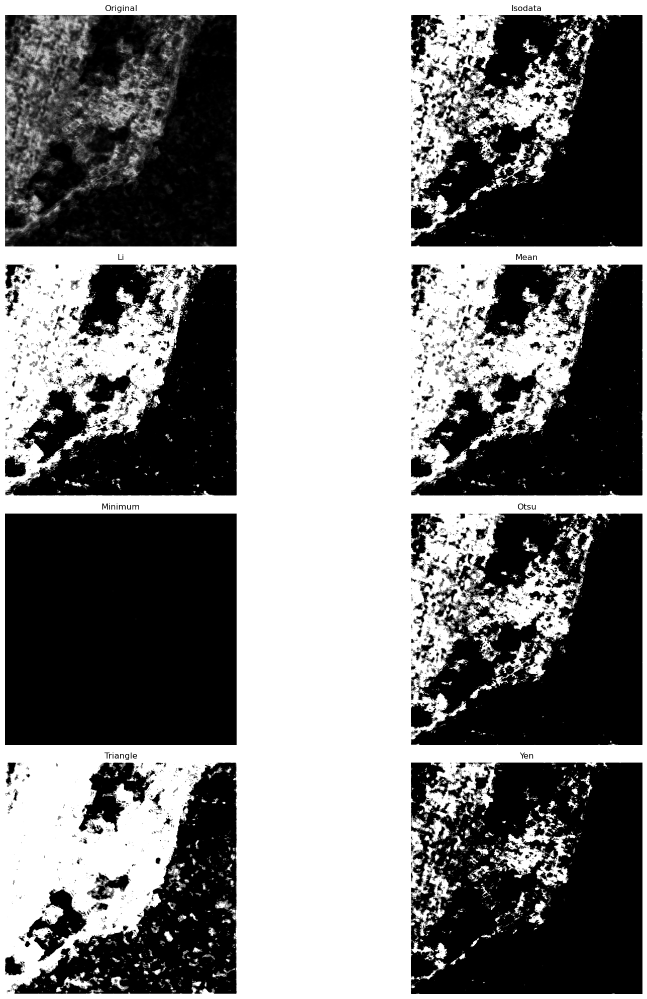

In [135]:
from skimage.filters import try_all_threshold

fig, ax = try_all_threshold(1-out_prob, figsize=(20, 20), verbose=False)

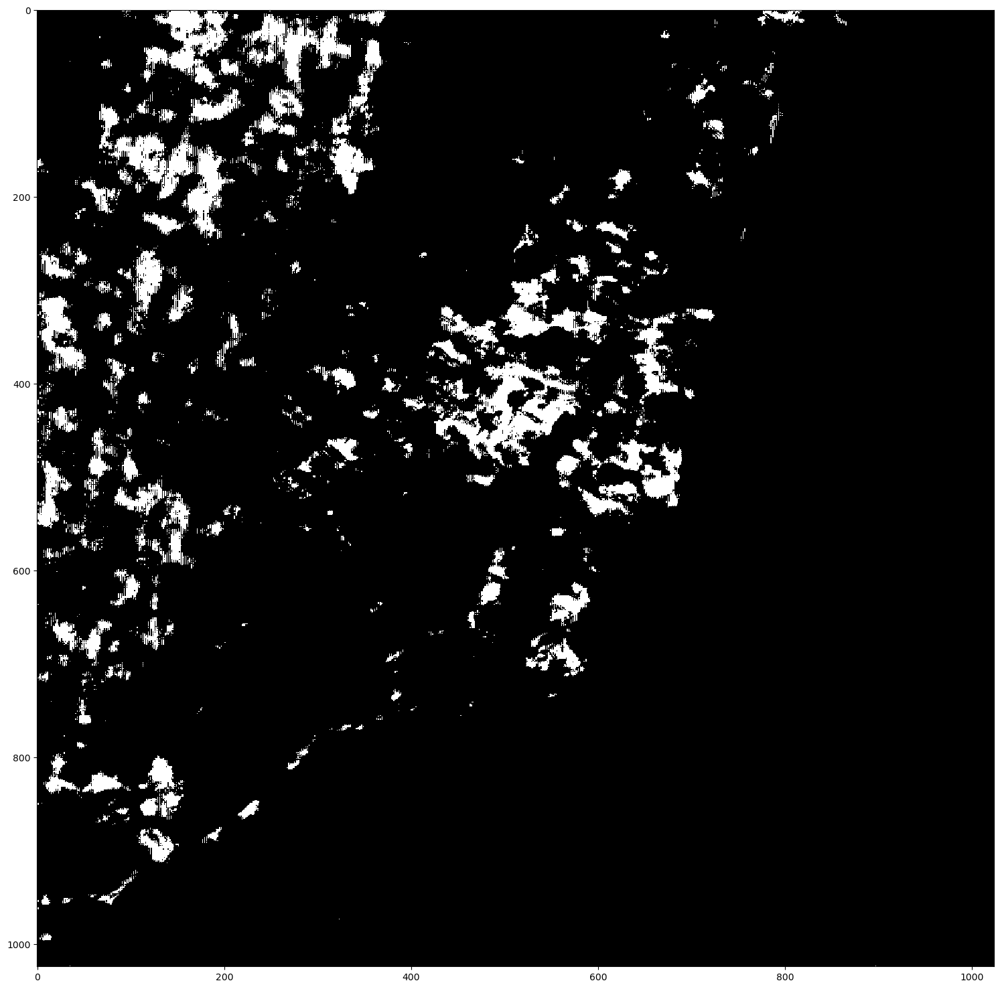

In [130]:
plt.figure(figsize=(15, 15))
io.imshow(out_prob < 0.7)

Text(0.5, 1.0, 'Final Level Set')

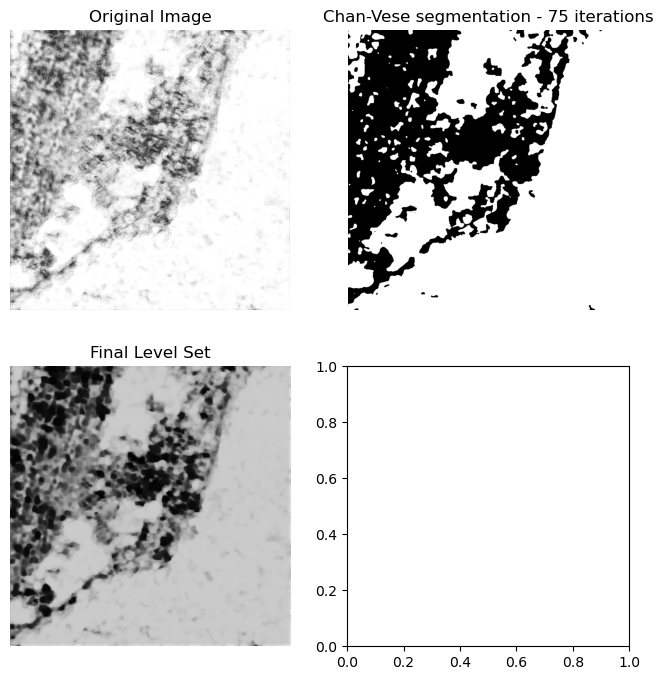

In [137]:
from skimage.segmentation import chan_vese
from skimage import data, img_as_float
image = img_as_float(out_prob)
# Feel free to play around with the parameters to see how they impact the result
cv = chan_vese(image, mu=0.25, lambda1=1, lambda2=1, tol=1e-3,
               max_num_iter=200, dt=0.5, init_level_set="checkerboard",
               extended_output=True)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.flatten()

ax[0].imshow(image, cmap="gray")
ax[0].set_axis_off()
ax[0].set_title("Original Image", fontsize=12)

ax[1].imshow(cv[0], cmap="gray")
ax[1].set_axis_off()
title = f'Chan-Vese segmentation - {len(cv[2])} iterations'
ax[1].set_title(title, fontsize=12)

ax[2].imshow(cv[1], cmap="gray")
ax[2].set_axis_off()
ax[2].set_title("Final Level Set", fontsize=12)

(-0.5, 1023.5, 1023.5, -0.5)

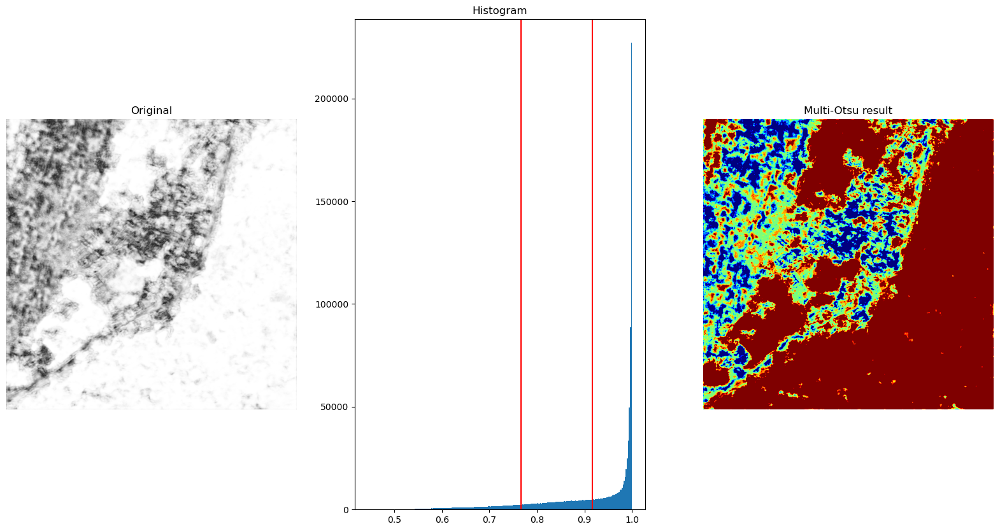

In [141]:
from skimage.filters import threshold_multiotsu
thresholds = threshold_multiotsu(image)

# Using the threshold values, we generate the three regions.
regions = np.digitize(image, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))

# Plotting the original image.
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')

# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')

# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')

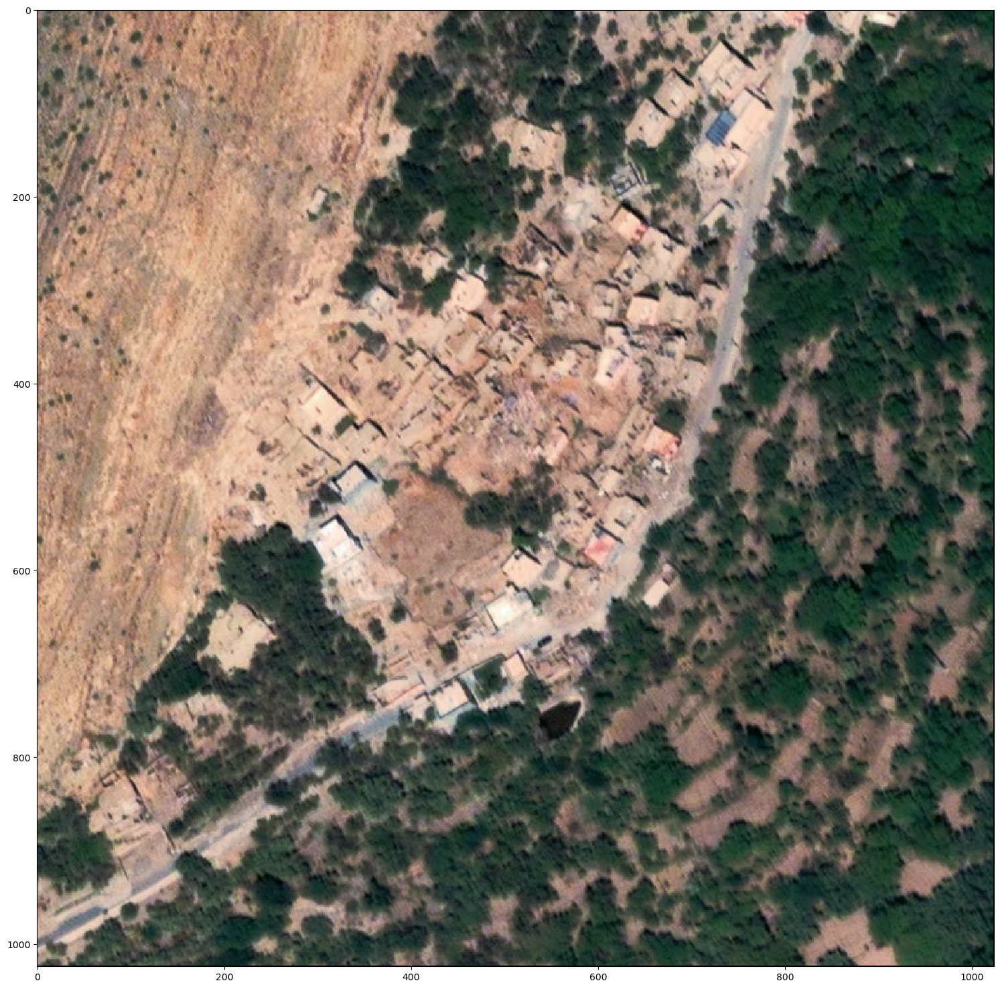

In [126]:
plt.figure(figsize=(15, 15))
io.imshow(batch[1][1])

In [62]:
L = 1024
N = 2

def test(dset):

    
    model.eval()
    tot_loss = 0
    tot_count = 0
    tot_accurate = 0
    n=2

    
    class_correct = list(0. for i in range(n))
    class_total = list(0. for i in range(n))
    class_accuracy = list(0. for i in range(n))
    
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    
    block_shape = (512, 512, 3)

    
    for im_name in dset.names:
        I1_full, I2_full, cm_full = test_dataset.get_img(im_name)
        
        I1_full = I1_full.detach().numpy().transpose(1, 2, 0)
        I2_full = I2_full.detach().numpy().transpose(1, 2, 0)
        
        s = cm_full.shape

        n_blocks = int(2 * I1_full.shape[0] / block_shape[0])
        
        I1_blocks = view_as_blocks(I1_full, block_shape).reshape(n_blocks, -1, *block_shape)
        I2_blocks = view_as_blocks(I2_full, block_shape).reshape(n_blocks, -1, *block_shape)
        cm_blocks = view_as_blocks(cm_full, block_shape[:-1]).reshape(n_blocks, -1, *block_shape[:-1])
        
        for i in range(n_blocks):
        
            I1 = torch.from_numpy(I1_blocks[i].transpose(0, 3, 1, 2)).float().to(device)
            I2 = torch.from_numpy(I2_blocks[i].transpose(0, 3, 1, 2)).float().to(device)
            cm = torch.from_numpy(cm_blocks[i]).float().to(device)
        
            output = model(I1, I2)
            loss = criterion(output, cm.long())
            
            tot_loss += loss.data * np.prod(cm.size())
            tot_count += np.prod(cm.size())
            
            _, predicted = torch.max(output.data, 1)
            
            # > 0 ?
            pred = predicted.detach().numpy().squeeze().astype(np.uint8)
            cm = cm.detach().numpy().squeeze().astype(np.uint8)
            
            for label in np.unique(cm):
                class_correct[label] += np.logical_and((cm == label), (pred == label)).sum()
                class_total[label] += (cm == label).sum()
            
            pr = (pred > 0)
            gt = (cm > 0)
            
            tp += np.logical_and(pr, gt).sum()
            tn += np.logical_and(np.logical_not(pr), np.logical_not(gt)).sum()
            fp += np.logical_and(pr, np.logical_not(gt)).sum()
            fn += np.logical_and(np.logical_not(pr), gt).sum()
        
    net_loss = tot_loss/tot_count
    net_accuracy = 100 * (tp + tn)/tot_count
    
    for i in range(n):
        class_accuracy[i] = 100 * class_correct[i] / max(class_total[i],0.00001)

    prec = tp / (tp + fp) if (tp + fp) > 0 else 0
    rec = tp / (tp + fn) if (tp + fn) > 0 else 0
    f_meas = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0
    prec_nc = tn / (tn + fn) if (tn + fn) > 0 else 0
    rec_nc = tn / (tn + fp) if (tn + fp) > 0 else 0
    
    pr_rec = [prec, rec, f_meas, prec_nc, rec_nc]
        
    return net_loss, net_accuracy, class_accuracy, pr_rec

In [172]:
# net.load_state_dict(torch.load('net-best_epoch-1_fm-0.7394933126157746.pth.tar'))

def train(n_epochs = N_EPOCHS, save = True):
    t = np.linspace(1, n_epochs, n_epochs)
    
    epoch_train_loss = 0 * t
    epoch_train_accuracy = 0 * t
    epoch_train_change_accuracy = 0 * t
    epoch_train_nochange_accuracy = 0 * t
    epoch_train_precision = 0 * t
    epoch_train_recall = 0 * t
    epoch_train_Fmeasure = 0 * t
    epoch_test_loss = 0 * t
    epoch_test_accuracy = 0 * t
    epoch_test_change_accuracy = 0 * t
    epoch_test_nochange_accuracy = 0 * t
    epoch_test_precision = 0 * t
    epoch_test_recall = 0 * t
    epoch_test_Fmeasure = 0 * t
    
#     mean_acc = 0
#     best_mean_acc = 0
    fm = 0
    best_fm = 0
    
    lss = 1000
    best_lss = 1000
    
    plt.figure(num=1)
    plt.figure(num=2)
    plt.figure(num=3)
    
    
    optimizer = torch.optim.Adam(net.parameters(), weight_decay=1e-4)
#     optimizer = torch.optim.Adam(net.parameters(), lr=0.0005)
        
    
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.95)
    
    # use tqdm
    for epoch_index in range(n_epochs):
        net.train()
        print('Epoch: ' + str(epoch_index + 1) + ' of ' + str(N_EPOCHS))

        tot_count = 0
        tot_loss = 0
        tot_accurate = 0
        class_correct = list(0. for i in range(2))
        class_total = list(0. for i in range(2))
#         for batch_index, batch in enumerate(tqdm(data_loader)):
        for batch in tqdm(train_loader):
            I1 = batch['I1'].float().to(device)
            I2 = batch['I2'].float().to(device)
            label = batch['label'].long().to(device)

            optimizer.zero_grad()
            output = net(I1, I2)
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()
            
        scheduler.step()


        epoch_train_loss[epoch_index], epoch_train_accuracy[epoch_index], cl_acc, pr_rec = test(train_dataset)
        epoch_train_nochange_accuracy[epoch_index] = cl_acc[0]
        epoch_train_change_accuracy[epoch_index] = cl_acc[1]
        epoch_train_precision[epoch_index] = pr_rec[0]
        epoch_train_recall[epoch_index] = pr_rec[1]
        epoch_train_Fmeasure[epoch_index] = pr_rec[2]
        
#         epoch_test_loss[epoch_index], epoch_test_accuracy[epoch_index], cl_acc, pr_rec = test(test_dataset)
        epoch_test_loss[epoch_index], epoch_test_accuracy[epoch_index], cl_acc, pr_rec = test(test_dataset)
        epoch_test_nochange_accuracy[epoch_index] = cl_acc[0]
        epoch_test_change_accuracy[epoch_index] = cl_acc[1]
        epoch_test_precision[epoch_index] = pr_rec[0]
        epoch_test_recall[epoch_index] = pr_rec[1]
        epoch_test_Fmeasure[epoch_index] = pr_rec[2]

       
        
        
#         mean_acc = (epoch_test_nochange_accuracy[epoch_index] + epoch_test_change_accuracy[epoch_index])/2
#         if mean_acc > best_mean_acc:
#             best_mean_acc = mean_acc
#             save_str = 'net-best_epoch-' + str(epoch_index + 1) + '_acc-' + str(mean_acc) + '.pth.tar'
#             torch.save(net.state_dict(), save_str)
        
        
#         fm = pr_rec[2]
        fm = epoch_train_Fmeasure[epoch_index]
        if fm > best_fm:
            best_fm = fm
            save_str = 'net-best_epoch-' + str(epoch_index + 1) + '_fm-' + str(fm) + '.pth.tar'
            torch.save(net.state_dict(), save_str)
        
        lss = epoch_train_loss[epoch_index]
        if lss < best_lss:
            best_lss = lss
            save_str = 'net-best_epoch-' + str(epoch_index + 1) + '_loss-' + str(lss) + '.pth.tar'
            torch.save(net.state_dict(), save_str)
            

        
    out = {'train_loss': epoch_train_loss[-1],
           'train_accuracy': epoch_train_accuracy[-1],
           'train_nochange_accuracy': epoch_train_nochange_accuracy[-1],
           'train_change_accuracy': epoch_train_change_accuracy[-1],
           'test_loss': epoch_test_loss[-1],
           'test_accuracy': epoch_test_accuracy[-1],
           'test_nochange_accuracy': epoch_test_nochange_accuracy[-1],
           'test_change_accuracy': epoch_test_change_accuracy[-1]}
    
    print('pr_c, rec_c, f_meas, pr_nc, rec_nc')
    print(pr_rec)
    
    return out


In [179]:
ds_test.labels_path.values

array(['/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/labels/task-9-annotation-9-by-1-tag-damage_building-0.png',
       '/home/rustt/Documents/Projects/building_damage/morocco_damage_building/data/processed/dataset/png/data_labelled/labels/task-19-annotation-19-by-1-tag-damage_building-0.png'],
      dtype=object)

In [178]:
out_dic

{'train_loss': 0.01445159874856472,
 'train_accuracy': 97.7054121284609,
 'train_nochange_accuracy': 100.0,
 'train_change_accuracy': 0.0,
 'test_loss': 0.00959861371666193,
 'test_accuracy': 96.70259059446254,
 'test_nochange_accuracy': 99.99999237060547,
 'test_change_accuracy': 0.0}

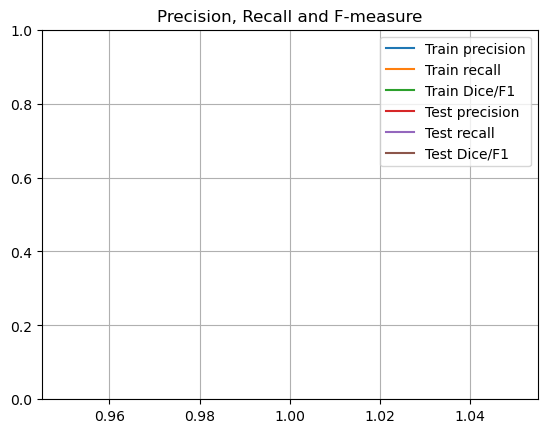

pr_c, rec_c, f_meas, pr_nc, rec_nc
[nan, 0.0, nan, 0.9670259059446255, 1.0]
{'train_loss': 0.01445159874856472, 'train_accuracy': 97.7054121284609, 'train_nochange_accuracy': 100.0, 'train_change_accuracy': 0.0, 'test_loss': 0.00959861371666193, 'test_accuracy': 96.70259059446254, 'test_nochange_accuracy': 99.99999237060547, 'test_change_accuracy': 0.0}
Elapsed time:
209.2512834072113


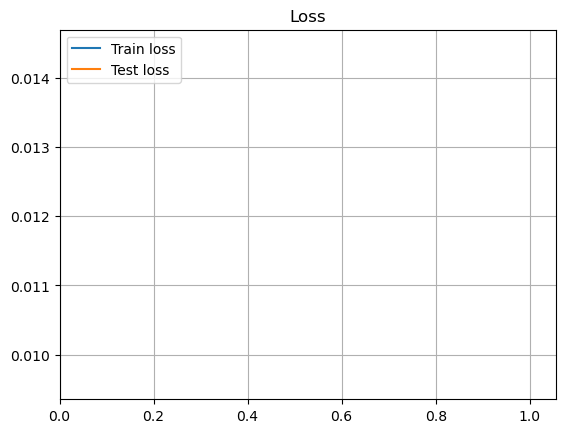

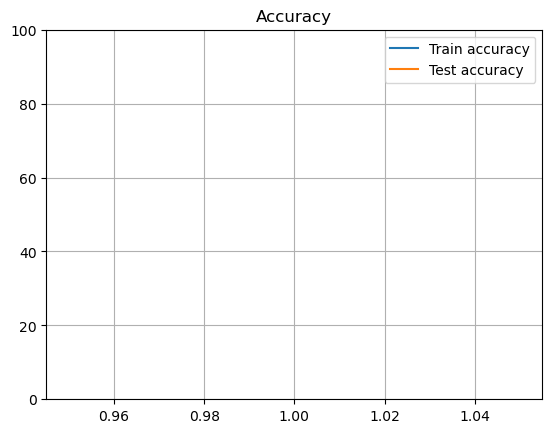

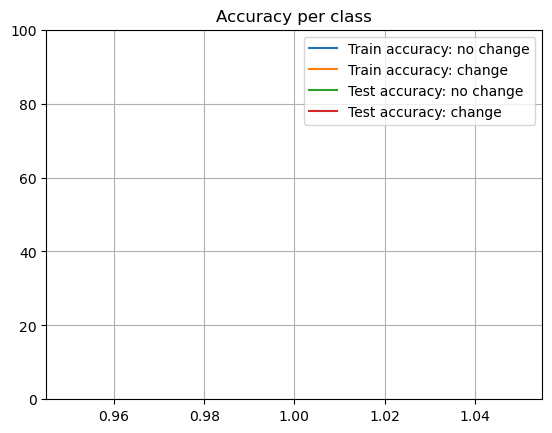

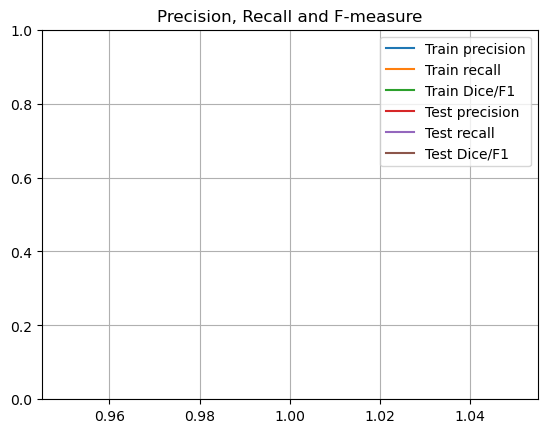

In [177]:
N_EPOCHS = 3

if LOAD_TRAINED:
    net.load_state_dict(torch.load('net_final.pth.tar'))
    print('LOAD OK')
else:
    t_start = time.time()
    out_dic = train()
    t_end = time.time()
    print(out_dic)
    print('Elapsed time:')
    print(t_end - t_start)

In [207]:
from skimage.util import view_as_blocks

In [ ]:
 plt.figure(num=1)
        plt.clf()
        l1_1, = plt.plot(t[:epoch_index + 1], epoch_train_loss[:epoch_index + 1], label='Train loss')
        l1_2, = plt.plot(t[:epoch_index + 1], epoch_test_loss[:epoch_index + 1], label='Test loss')
        plt.legend(handles=[l1_1, l1_2])
        plt.grid()
#         plt.gcf().gca().set_ylim(bottom = 0)
        plt.gcf().gca().set_xlim(left = 0)
        plt.title('Loss')
        display.clear_output(wait=True)
        display.display(plt.gcf())

        plt.figure(num=2)
        plt.clf()
        l2_1, = plt.plot(t[:epoch_index + 1], epoch_train_accuracy[:epoch_index + 1], label='Train accuracy')
        l2_2, = plt.plot(t[:epoch_index + 1], epoch_test_accuracy[:epoch_index + 1], label='Test accuracy')
        plt.legend(handles=[l2_1, l2_2])
        plt.grid()
        plt.gcf().gca().set_ylim(0, 100)
#         plt.gcf().gca().set_ylim(bottom = 0)
#         plt.gcf().gca().set_xlim(left = 0)
        plt.title('Accuracy')
        display.clear_output(wait=True)
        display.display(plt.gcf())

        plt.figure(num=3)
        plt.clf()
        l3_1, = plt.plot(t[:epoch_index + 1], epoch_train_nochange_accuracy[:epoch_index + 1], label='Train accuracy: no change')
        l3_2, = plt.plot(t[:epoch_index + 1], epoch_train_change_accuracy[:epoch_index + 1], label='Train accuracy: change')
        l3_3, = plt.plot(t[:epoch_index + 1], epoch_test_nochange_accuracy[:epoch_index + 1], label='Test accuracy: no change')
        l3_4, = plt.plot(t[:epoch_index + 1], epoch_test_change_accuracy[:epoch_index + 1], label='Test accuracy: change')
        plt.legend(handles=[l3_1, l3_2, l3_3, l3_4])
        plt.grid()
        plt.gcf().gca().set_ylim(0, 100)
#         plt.gcf().gca().set_ylim(bottom = 0)
#         plt.gcf().gca().set_xlim(left = 0)
        plt.title('Accuracy per class')
        display.clear_output(wait=True)
        display.display(plt.gcf())

        plt.figure(num=4)
        plt.clf()
        l4_1, = plt.plot(t[:epoch_index + 1], epoch_train_precision[:epoch_index + 1], label='Train precision')
        l4_2, = plt.plot(t[:epoch_index + 1], epoch_train_recall[:epoch_index + 1], label='Train recall')
        l4_3, = plt.plot(t[:epoch_index + 1], epoch_train_Fmeasure[:epoch_index + 1], label='Train Dice/F1')
        l4_4, = plt.plot(t[:epoch_index + 1], epoch_test_precision[:epoch_index + 1], label='Test precision')
        l4_5, = plt.plot(t[:epoch_index + 1], epoch_test_recall[:epoch_index + 1], label='Test recall')
        l4_6, = plt.plot(t[:epoch_index + 1], epoch_test_Fmeasure[:epoch_index + 1], label='Test Dice/F1')
        plt.legend(handles=[l4_1, l4_2, l4_3, l4_4, l4_5, l4_6])
        plt.grid()
        plt.gcf().gca().set_ylim(0, 1)
#         plt.gcf().gca().set_ylim(bottom = 0)
#         plt.gcf().gca().set_xlim(left = 0)
        plt.title('Precision, Recall and F-measure')
        display.clear_output(wait=True)
        display.display(plt.gcf())


            
#         print('Epoch loss: ' + str(tot_loss/tot_count))
        if save:
            im_format = 'png'
    #         im_format = 'eps'

            plt.figure(num=1)
            plt.savefig(net_name + '-01-loss.' + im_format)

            plt.figure(num=2)
            plt.savefig(net_name + '-02-accuracy.' + im_format)

            plt.figure(num=3)
            plt.savefig(net_name + '-03-accuracy-per-class.' + im_format)

            plt.figure(num=4)
            plt.savefig(net_name + '-04-prec-rec-fmeas.' + im_format)

In [222]:
block_shape = (512, 512, 3)
blocks = view_as_blocks(I1_full.detach().numpy().transpose(1, 2, 0), block_shape)

In [220]:
blocks.shape

(2, 2, 1, 512, 512, 3)

In [228]:
np.hstack(blocks).shape

(2, 2, 512, 512, 3)

In [231]:
blocks_resh  = blocks.reshape(4, -1, *block_shape)

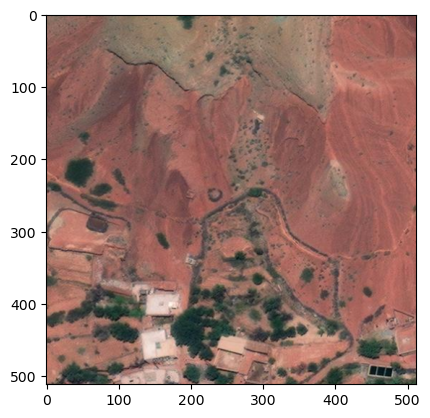

In [234]:
plt.imshow(blocks_resh[1].squeeze())

In [223]:
for b in blocks:
    print(b.shape)

(2, 1, 512, 512, 3)
(2, 1, 512, 512, 3)


In [215]:
I1_full.permute(1, 2, 0).shape

torch.Size([1024, 1024, 3])

In [238]:
blocks_resh[0].shape

(1, 512, 512, 3)

In [261]:
cm_blocks.shape

(4, 1, 512, 512)

In [301]:
I1_full, I2_full, cm_full = test_dataset.get_img(im_name)

I1_full = I1_full.detach().numpy().transpose(1, 2, 0)
I2_full = I2_full.detach().numpy().transpose(1, 2, 0)
print(cm_full.shape)
s = cm_full.shape

n = 2
class_correct = list(0. for i in range(n))
class_total = list(0. for i in range(n))
class_accuracy = list(0. for i in range(n))

tp = 0
tn = 0
fp = 0
fn = 0

tot_loss = 0
tot_count = 0
# now it's numpy arr

block_shape = (512, 512, 3)

n_blocks = int(2 * I1_full.shape[0] / block_shape[0])
print(n_blocks)
I1_blocks = view_as_blocks(I1_full, block_shape).reshape(n_blocks, -1, *block_shape)
I2_blocks = view_as_blocks(I2_full, block_shape).reshape(n_blocks, -1, *block_shape)
cm_blocks = view_as_blocks(cm_full, block_shape[:-1]).reshape(n_blocks, -1, *block_shape[:-1])

for i in range(n_blocks):

    I1 = torch.from_numpy(I1_blocks[i].transpose(0, 3, 1, 2)).float().to(device)
    I2 = torch.from_numpy(I2_blocks[i].transpose(0, 3, 1, 2)).float().to(device)
    cm = torch.from_numpy(cm_blocks[i]).float().to(device)

    output = net(I1, I2)
    loss = criterion(output, cm.long())
    #         print(loss)
    tot_loss += loss.data * np.prod(cm.size())
    tot_count += np.prod(cm.size())
    
    _, predicted = torch.max(output.data, 1)
    
    # > 0 ?
    pred = predicted.detach().numpy().squeeze().astype(np.uint8)
    cm = cm.detach().numpy().squeeze().astype(np.uint8)
    
    for label in np.unique(cm):
        class_correct[label] += np.logical_and((cm == label), (pred == label)).sum()
        class_total[label] += (cm == label).sum()
    
    pr = (pred > 0)
    gt = (cm > 0)
    
    tp += np.logical_and(pr, gt).sum()
    tn += np.logical_and(np.logical_not(pr), np.logical_not(gt)).sum()
    fp += np.logical_and(pr, np.logical_not(gt)).sum()
    fn += np.logical_and(np.logical_not(pr), gt).sum()

(1024, 1024)
4


In [300]:
class_total

[262144.0, 0.0]

In [299]:
class_correct

[262144.0, 0.0]

In [265]:
predicted

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])

In [268]:
n = 2
class_correct = list(0. for i in range(n))
class_total = list(0. for i in range(n))

c = (predicted.int() == cm.data.int())
for i in range(c.size(1)):
    for j in range(c.size(2)):
        l = int(cm.data[0, i, j])
        class_correct[l] += c[0, i, j]
        class_total[l] += 1
        
pr = (predicted.int() > 0).cpu().numpy()
gt = (cm.data.int() > 0).cpu().numpy()

In [276]:
pred = predicted.detach().numpy().squeeze().astype(np.uint8)
cm = cm.squeeze().astype(np.uint8)

In [277]:
cm.shape

(512, 512)

In [278]:
pred.shape

(512, 512)

In [280]:
p = np.eye(10, 10)
p[3, 5] = 1
p[3, 3] = 0
p[6,6] = 0

m = np.eye(10, 10)

In [287]:
p

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

In [288]:
m

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

In [291]:
p0 = (p == 0)
p1 = (p == 1)
m0 = (m==0)
m1 = (m==1)

In [289]:
np.logical_and(p0, m0).sum()

89

In [292]:
np.logical_and(p1, m1).sum()

8

In [270]:
class_correct

[tensor(262144.), 0.0]

In [269]:
class_total

[262144.0, 0.0]

In [294]:
for _ in np.unique(cm): 
    print(_)

0


In [ ]:
c = (predicted.int() == cm.data.int())
for i in range(c.size(1)):
    for j in range(c.size(2)):
        l = int(cm.data[0, i, j])
        class_correct[l] += c[0, i, j]
        class_total[l] += 1
        
pr = (predicted.int() > 0).cpu().numpy()
gt = (cm.data.int() > 0).cpu().numpy()

tp += np.logical_and(pr, gt).sum()
tn += np.logical_and(np.logical_not(pr), np.logical_not(gt)).sum()
fp += np.logical_and(pr, np.logical_not(gt)).sum()
fn += np.logical_and(np.logical_not(pr), gt).sum()


In [295]:
n = 2
class_correct = list(0. for i in range(n))
class_total = list(0. for i in range(n))
class_accuracy = list(0. for i in range(n))

output = net(I1, I2)
loss = criterion(output, cm)
#         print(loss)
tot_loss += loss.data * np.prod(cm.size())
tot_count += np.prod(cm.size())

_, predicted = torch.max(output.data, 1)

# > 0 ?
pred = predicted.detach().numpy().squeeze().astype(np.uint8)
cm = cm.squeeze().astype(np.uint8)

for label in np.unique(cm):
    class_correct[label] = np.logical_and((cm == label), (pred == label)).sum()
    class_total[label] = (cm == label).sum()

pr = (pred > 0)
gt = (cm > 0)

tp += np.logical_and(pr, gt).sum()
tn += np.logical_and(np.logical_not(pr), np.logical_not(gt)).sum()
fp += np.logical_and(pr, np.logical_not(gt)).sum()
fn += np.logical_and(np.logical_not(pr), gt).sum()


AttributeError: 'numpy.ndarray' object has no attribute 'long'

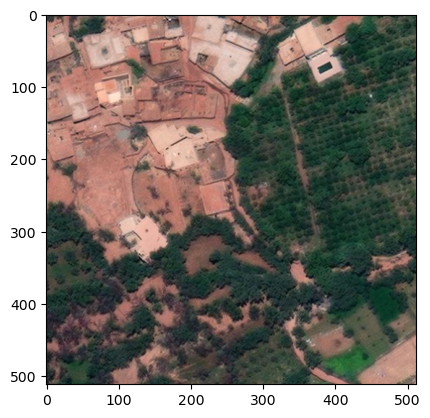

In [256]:
plt.imshow(I1.squeeze(1).permute(1, 2, 0).detach().numpy().astype(np.uint8))

In [251]:
I1.shape

torch.Size([3, 1, 512, 512])

In [192]:
I1.shape

torch.Size([3, 512, 1023])

In [175]:
N=2
s=(1024, 1024)
steps0 = np.arange(0,s[0],ceil(s[0]/N))
steps1 = np.arange(0,s[1],ceil(s[1]/N))
print(steps0)

[  0 512]


In [176]:
steps0

array([  0, 512])

In [194]:
I1 = torch.unsqueeze(I1, 0).float().to(device)
I2 = torch.unsqueeze(I2, 0).float().to(device)
cm = torch.unsqueeze(torch.from_numpy(1.0*cm),0).long().to(device)


output = net(I1, I2)

In [196]:
output.shape

torch.Size([1, 2, 512, 1023])

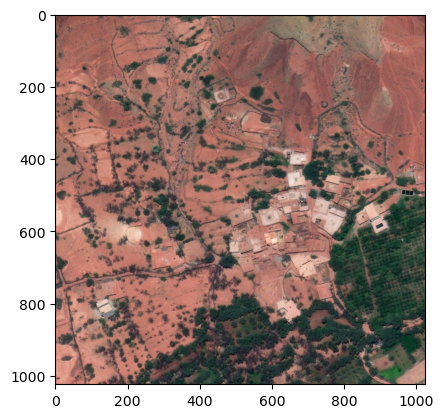

In [200]:
plt.imshow(I1_full.detach().numpy().transpose(1, 2, 0))

In [201]:
plt.imshow(I1.detach().numpy().transpose(1, 2, 0))

ValueError: axes don't match array

In [203]:
output.shape

torch.Size([1, 2, 512, 1023])